In [6]:
import numpy as np
import imgaug.augmenters as iaa
import imageio
import imgaug as ia
%matplotlib inline

original


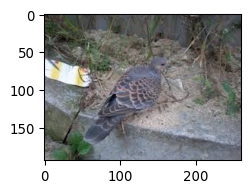

In [15]:
images = imageio.imread('pg5.jpg')
print("original")
ia.imshow(images)

In [19]:
#폴더에 있는 pg1.jpg부터 pg18.jpg 까지 numpy배열로 바꾸기

for i in range(1,19):
    globals()['pg{}'.format(i)]=np.asarray(Image.open("pg%d.jpg"%i))

In [54]:
import numpy as np
from PIL import Image
pg2 = np.asarray(Image.open("pg2.jpg"))
print("pg2 : ", np.shape(pg2))
print("pg2 : ", pg2)

pg2 :  (167, 301, 3)
pg2 :  [[[150 139 111]
  [142 130 104]
  [151 139 113]
  ...
  [113 105  82]
  [119 111  88]
  [134 126 105]]

 [[149 138 110]
  [139 127 101]
  [151 139 113]
  ...
  [112 104  81]
  [120 112  89]
  [137 129 108]]

 [[152 141 113]
  [138 126 100]
  [150 138 112]
  ...
  [143 135 112]
  [144 136 113]
  [152 144 123]]

 ...

 [[111 100  98]
  [111 100  98]
  [110  99  97]
  ...
  [107  95  71]
  [110  98  76]
  [110  99  79]]

 [[106  95  93]
  [106  95  93]
  [105  94  92]
  ...
  [104  92  68]
  [108  96  74]
  [109  98  78]]

 [[101  90  88]
  [102  91  89]
  [102  91  89]
  ...
  [102  90  66]
  [107  95  73]
  [109  98  78]]]


Augmented:


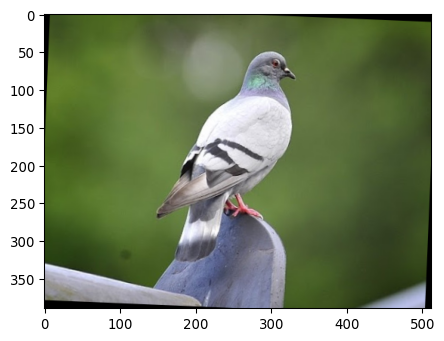

In [13]:
ia.seed(4)

rotate = iaa.Affine(rotate=(-25, 25))
image_aug = rotate(image=image)

print("Augmented:")
ia.imshow(image_aug)

Augmented batch:


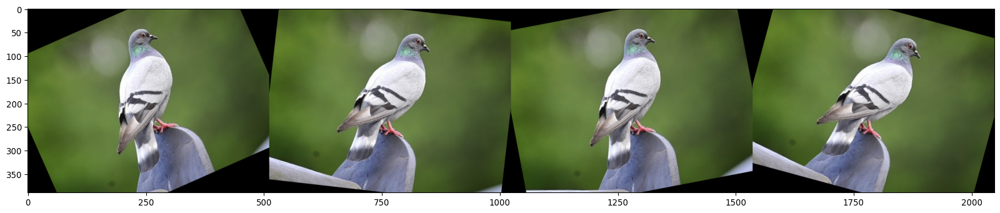

In [14]:
import numpy as np

images = [image, image, image, image]
images_aug = rotate(images=images)

print("Augmented batch:")
ia.imshow(np.hstack(images_aug))

Augmented:


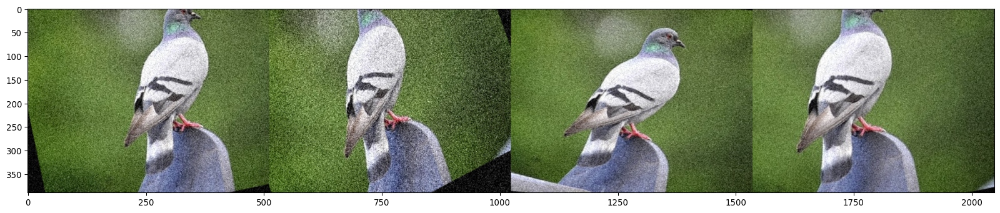

In [15]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 60)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq(images=images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

Augmented:


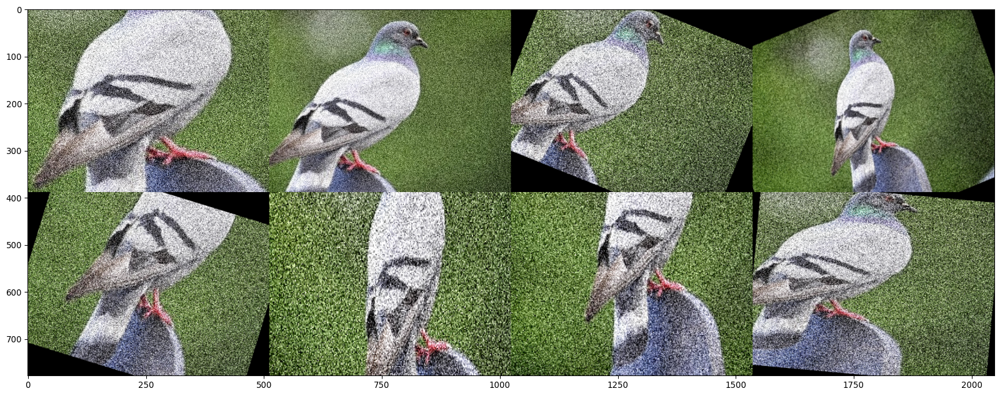

In [16]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True)

images_aug = [seq(image=image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

Augmented:


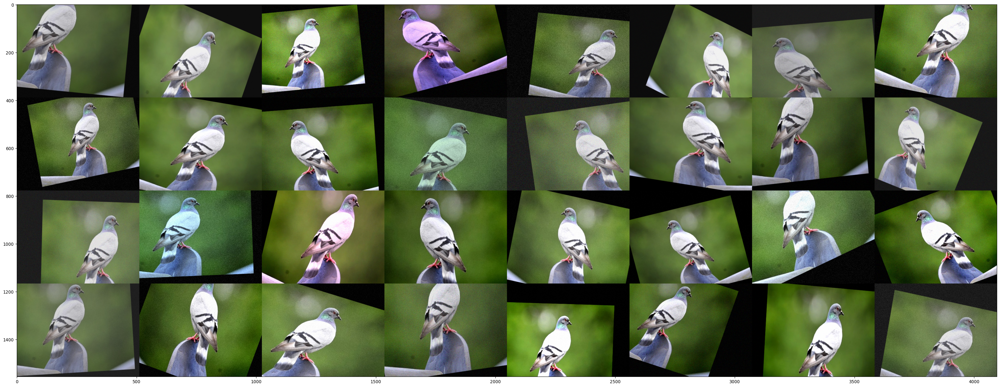

In [30]:
ia.seed(1)

# Example batch of images.
# The array has shape (32, 64, 64, 3) and dtype uint8.
images = np.array(
    [pg1 for _ in range(32)],
    dtype=np.uint8
)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True) # apply augmenters in random order

images_aug = seq(images=images)
print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=4))
